# Project: Exploration and analysis Airbnb data of Madrid
Author: Luis Carrascosa Cabrera

# Analysing Airbnb data with pandas and plotly


## Introduction
Airbnb is the world’s biggest accommodation-sharing site. Its rapid growth and impact on vacation rentals has generated heated discussions about its effect in several of the world's largest cities. So much that regulations have emerged against the free use of this website:

* Amsterdam: the rental of complete houses is limited to 60 days a year and this will be reduced by half
* Barcelona: short-term rentals must have a license and new licenses are not being issued
* Berlin: owners need a permission to rent 50% or more of their main residence for a short period of time
* London: short-term rentals of entire houses are restricted to 90 days a year
* Palma: the mayor has announced the ban on short-term rentals
* New York: It is usually illegal to rent apartments for 30 consecutive days or less, unless the host is present
* Paris: short-term rentals are limited to 120 days a year
* San Francisco: hosts must register as a company and obtain certificates for short-term rental. The rental of entire properties is limited to 90 days a year
* Singapore: the minimum period of public housing rental is six consecutive months
* Tokyo: home sharing was legalized only in 2017 and is limited to 180 days a year
<div style="text-align: right"><i>Source: https://www.bbc.com/mundo/noticias-45355426</i></div>


Given the [Airbnb dataset of Madrid](http://insideairbnb.com/get-the-data.html), we propose to obtain the following information:

* Which areas have the most Airbnb properties, and which are the most expensive?
* Which amenities increase the price of an Airbnb listing?
* Influence of host features

## Libraries used and version control
I will use numpy, pandas and plotly for the visualization. It's necessary a free mapbox account for drawing maps with plotly

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime
from scipy import stats
from plotly.subplots import make_subplots
%matplotlib inline

In [2]:
mapbox_token_folder = "/home/luis/Documentos/mapbox"
mapbox_access_token = open(f"{mapbox_token_folder}/token").read()
px.set_mapbox_access_token(mapbox_access_token)

### Version control

In [3]:
print(f'numpy version: {np.__version__}')
print(f'pandas version: {pd.__version__}')
print(f'geopandas version: {gpd.__version__}')

numpy version: 1.18.1
pandas version: 0.25.3
geopandas version: 0.6.2


In [4]:
pip show geojson

Name: geojson
Version: 2.5.0
Summary: Python bindings and utilities for GeoJSON
Home-page: https://github.com/jazzband/geojson
Author: Sean Gillies
Author-email: sgillies@frii.com
License: BSD
Location: /home/luis/Documentos/enviroments/desarrollo/lib/python3.8/site-packages
Requires: 
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip show matplotlib

Name: matplotlib
Version: 3.1.2
Summary: Python plotting package
Home-page: https://matplotlib.org
Author: John D. Hunter, Michael Droettboom
Author-email: matplotlib-users@python.org
License: PSF
Location: /home/luis/Documentos/enviroments/desarrollo/lib/python3.8/site-packages
Requires: kiwisolver, pyparsing, python-dateutil, numpy, cycler
Required-by: seaborn, descartes
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip show plotly

Name: plotly
Version: 4.4.1
Summary: An open-source, interactive graphing library for Python
Home-page: https://plot.ly/python/
Author: Chris P
Author-email: chris@plot.ly
License: MIT
Location: /home/luis/Documentos/enviroments/desarrollo/lib/python3.8/site-packages
Requires: six, retrying
Required-by: 
Note: you may need to restart the kernel to use updated packages.


## Processing the data
### Import the data

The dataset used for this project comes from Insideairbnb.com. The dataset was scraped on 2019-11-09 and contains information on all Madrid Airbnb listings that were live on the site on that date (20.539)

I will not import free text fields and I will remove the currency symbol from fields with amounts. "smart_location", "zipcode" are redundant having latitude and longitude. "reviews_per_month", "number_of_reviews_ltm" with "number_of_reviews" too. url fields does not add value to the model. I don import "host_name", "host_location" and "host_about" too

In [7]:
datasetDir = "./dataset"

import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF8') 
conv = locale.localeconv()

fconv_prices = lambda x : locale.atof(x.strip(conv['currency_symbol'])) if x else np.nan 

def fdate_parser(x, dtime_format = "%d-%m-%Y"):
    return datetime.strptime(x, dtime_format) 

In [8]:
df = pd.read_csv(
    f'{datasetDir}/listings_detailed.csv', 
    sep = ',', 
    index_col = 'id', 
    converters = {
        'price': fconv_prices, 
        'weekly_price': fconv_prices, 
        'monthly_price': fconv_prices,
        'security_deposit': fconv_prices,
        'cleaning_fee': fconv_prices,
        'extra_people': fconv_prices
    },
    parse_dates = ['first_review', 'last_review', 'host_since'],
    usecols = lambda column : column not in [
        'zipcode', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 
        'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 
        'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_url', 'host_name', 
        'host_location', 'host_about', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 
        'host_verifications', 'calendar_last_scraped', 'listing_url', 'smart_location',
        'reviews_per_month', 'number_of_reviews_ltm', 'host_id'
    ]
)

df.head(3)

,experiences_offered,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,...,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
id,,,,,,,,,,,,,,,,,,,,,
6369,none,2009-04-16,within a few hours,100%,NaN,f,2.0,2.0,t,f,...,NaN,f,f,flexible,f,f,2,0,2,0
21853,none,2010-02-21,NaN,NaN,NaN,f,2.0,2.0,t,t,...,NaN,f,f,strict_14_with_grace_period,f,f,2,0,2,0
23001,none,2010-02-17,within an hour,100%,NaN,f,9.0,9.0,t,f,...,NaN,f,f,moderate,f,f,5,5,0,0


### Cleaning the features

I will drop columns with more than 85% nulls

In [9]:
cols_to_drop = set(df.columns[df.isna().mean()>0.85])
print(cols_to_drop)

{'host_acceptance_rate', 'monthly_price', 'square_feet', 'weekly_price', 'jurisdiction_names'}


In [10]:
df.drop(cols_to_drop, axis='columns', inplace=True)

We only use latitude, longitude and neighbourhood_cleansed location. As we are studying Madrid, the city and country columns do not contribute anything

In [11]:
df_gps = df[['latitude', 'longitude']]
df_gps.head()

,latitude,longitude
id,,
6369,40.45628,-3.67763
21853,40.40341,-3.74084
23001,40.38695,-3.69304
24805,40.42202,-3.70395
24836,40.41995,-3.69764


In [12]:
df.drop(
    ['neighbourhood', 'neighbourhood_group_cleansed', 'street', 'city', 'state', 'country', 
     'country_code', 'is_location_exact', 'latitude', 'longitude']
    , axis='columns', inplace=True
)

For the number of nights we will only leave "minimum_nights" and "maximum_nights"

In [13]:
df.drop(
    ['minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 
     'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm']
    , axis='columns', inplace=True
)

Of the host count columns we will not keep any of them

In [14]:
df.drop(
    ['host_total_listings_count', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 
     'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms',
    'host_listings_count']
    , axis='columns', inplace=True
)

We will change the price column for the price per guest

In [15]:
df['B_price_guests'] = df['price']/df['guests_included']

df.drop(['price'], axis='columns', inplace=True)
df['B_price_guests'].head()

id
6369     35.00
21853    17.00
23001    60.00
24805    40.00
24836    28.75
Name: B_price_guests, dtype: float64

We'll eliminate prices per guest above quantile 95. Thus we will eliminate possible artificially high prices due to the effect of smart pricing

In [16]:
outliers = list(df[df['B_price_guests'] >= df['B_price_guests'].quantile(.95)].index)
print(len(outliers))

1087


In [17]:
df_rev = df.drop(outliers, axis='rows', inplace=False)

box1 = go.Box(y=df['B_price_guests'])
box2 = go.Box(y=df_rev['B_price_guests'])

fig = make_subplots(rows=1, cols=2, subplot_titles=("Original", "95% outliers removal"))
fig.add_trace(box1, row=1, col=1)
fig.add_trace(box2, row=1, col=2)
fig.update_layout(showlegend=False)

fig.show()

Thus we eliminate prices per guest that exceed 5000 and even reach 9000 dollars. Let's compare prices per guest in both dataset

In [18]:
plotData1 = go.Scatter(
    x=df.index, y=df['B_price_guests'], 
    mode='markers',
    marker=dict(
        color='LightSkyBlue',
        size=2
    )
)

plotData2 = go.Scatter(
    x=df_rev.index, y=df_rev['B_price_guests'], 
    mode='markers',
    marker=dict(
        color='LightSkyBlue',
        size=2
    )
)

layout = go.Layout(
    title={'x': 0.5},
    xaxis={'title': 'id'},
    yaxis={'title': 'B_price_guests'},
    margin=go.layout.Margin(l=0, r=0, t=0, b=0)
)

fig = make_subplots(rows=2, cols=1, subplot_titles=("Madrid airbnb data", 
                                                    "Madrid airbnb data without 95% outliers"))
fig.add_trace(plotData1, row=1, col=1)
fig.add_trace(plotData2, row=2, col=1)
fig.update_layout(showlegend=False)

fig.update_layout(title_text='Price per guest')

fig.show()

We don't lose the two concentrations near the ids 20M and 35M.
<br>Let's represent each column to review them

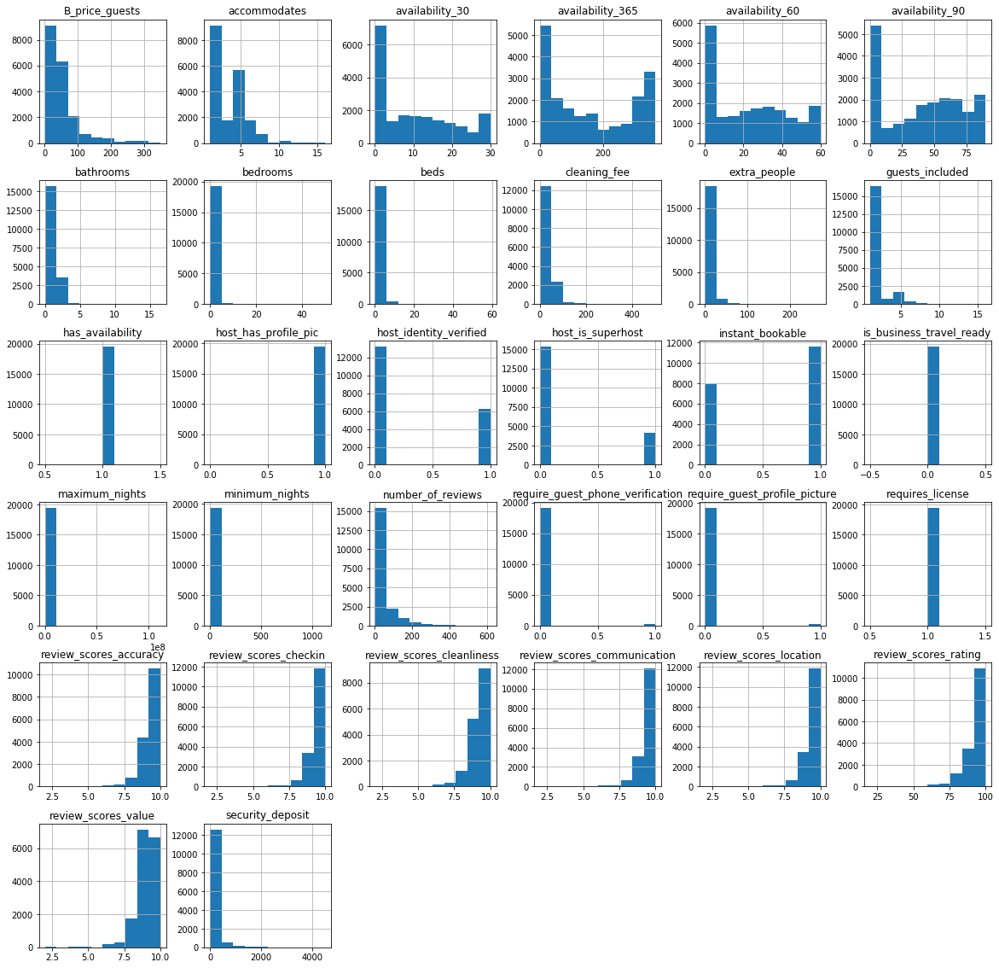

In [19]:
# Replacing columns with f/t with 0/1
df_temp = df_rev.replace({'f': 0, 't': 1}, inplace=False)

# Plotting the distribution of numerical and boolean categories
df_temp.hist(figsize=(20,20));

Columns with only one category are deleted

In [20]:
df_rev.drop(['has_availability', 'host_has_profile_pic', 'is_business_travel_ready', 'require_guest_phone_verification', 
 'require_guest_profile_picture', 'requires_license'], 
        axis='columns', inplace=True)

### Categorical features
We review the categorical and datetime variables one by one:

In [21]:
cat_cols = df_rev.select_dtypes(include=['object', 'datetime64']).columns
list(cat_cols)

['experiences_offered',
 'host_since',
 'host_response_time',
 'host_response_rate',
 'host_is_superhost',
 'host_identity_verified',
 'neighbourhood_cleansed',
 'market',
 'property_type',
 'room_type',
 'bed_type',
 'amenities',
 'calendar_updated',
 'first_review',
 'last_review',
 'license',
 'instant_bookable',
 'cancellation_policy']

**experiences_offered**

In [22]:
df_rev.experiences_offered.value_counts()

none    19452
Name: experiences_offered, dtype: int64

In [23]:
# we erase it because there is only one value
df_rev.drop(['experiences_offered'], axis='columns', inplace=True)

**host_since** - date that the host first joined Airbnb
<br>We will calculate the difference of days and replace the nulls with the median

In [24]:
df_rev['B_host_days_active'] = (datetime(2019, 11, 9) - df_rev.host_since).astype('timedelta64[D]')

print("Mean days as host:", round(df_rev['B_host_days_active'].mean(),0))
print("Median days as host:", df_rev['B_host_days_active'].median())

df_rev.B_host_days_active.fillna(df_rev.B_host_days_active.median(), inplace=True)
df_rev.drop(['host_since'], axis='columns', inplace=True)

df_rev.B_host_days_active

Mean days as host: 1326.0
Median days as host: 1271.0


id
6369        3859.0
21853       3548.0
23001       3552.0
24805       3510.0
24836       3510.0
             ...  
39966002    2034.0
39966151     319.0
39966578       1.0
39967851    1554.0
39970225      51.0
Name: B_host_days_active, Length: 19452, dtype: float64

**host_response_time** - average amount of time the host takes to reply to messages
<br>There is some possible values and nans. This nans we will impute these to a new value: unknown

In [25]:
df_rev.host_response_time.fillna("unknown", inplace=True)

In [26]:
df_rev.host_response_time.value_counts()

within an hour        11625
unknown                3498
within a few hours     2539
within a day           1382
a few days or more      408
Name: host_response_time, dtype: int64

**host_response_rate**
<br>Analogous case but for which we will group in a categorical variable: "unknown", \[0-49%\], \[50-89%\], \[90-99%\] y 100%

In [27]:
df_rev.host_response_rate.value_counts()

100%    10906
90%       577
96%       449
80%       364
98%       356
        ...  
29%         2
34%         1
68%         1
46%         1
11%         1
Name: host_response_rate, Length: 65, dtype: int64

In [28]:
def bin_columns(dframe, cols, bins, labels, nan_label):
    for col in cols:
        dframe[col] = pd.cut(dframe[col],
                             bins=bins, 
                             labels=labels, 
                             include_lowest=True)

        dframe[col] = dframe[col].astype('str')
        dframe[col].replace('nan', nan_label, inplace=True)

In [29]:
df_rev.host_response_rate = df_rev.host_response_rate.str[:-1].astype('float64')

df_rev.host_response_rate = pd.cut(df_rev.host_response_rate, 
                                   bins=[0, 50, 90, 99, 100], 
                                   labels=['0-49%', '50-89%', '90-99%', '100%'], 
                                   include_lowest=True)

df_rev.host_response_rate = df_rev.host_response_rate.astype('str')
df_rev.host_response_rate.replace('nan', 'unknown', inplace=True)

df_rev.host_response_rate.value_counts()

100%       10906
unknown     3498
90-99%      2310
50-89%      2172
0-49%        566
Name: host_response_rate, dtype: int64

**host_is_superhost** - whether or not the host is a superhost, which is a mark of quality for the top-rated and most experienced hosts
<br>There are only 12 nans. We will review the rest of columns "host_"

In [30]:
df_rev[df_rev.host_is_superhost.isna()].filter(like='host_')

,host_response_time,host_response_rate,host_is_superhost,host_identity_verified,B_host_days_active
id,,,,,
782797,unknown,unknown,NaN,NaN,1271.0
6899113,unknown,unknown,NaN,NaN,1271.0
7712666,unknown,unknown,NaN,NaN,1271.0
8728948,unknown,unknown,NaN,NaN,1271.0
8844082,unknown,unknown,NaN,NaN,1271.0
8963605,unknown,unknown,NaN,NaN,1271.0
11257292,unknown,unknown,NaN,NaN,1271.0
16585743,unknown,unknown,NaN,NaN,1271.0
23518338,unknown,unknown,NaN,NaN,1271.0


"host_is_superhost", "host_listings_count" and "host_identity_verified" has the same nulls. We drop these listings

In [31]:
df_rev.drop(df_rev[df_rev.host_is_superhost.isna()].index, inplace = True)

In [32]:
df_rev[df_rev.host_is_superhost.isna()].filter(like='host_')

,host_response_time,host_response_rate,host_is_superhost,host_identity_verified,B_host_days_active
id,,,,,


**host_identity_verified** - whether or not the host has been verified with id

In [33]:
df_rev.host_identity_verified.isna().sum()

0

In [34]:
df_rev.host_identity_verified.value_counts()

f    13179
t     6261
Name: host_identity_verified, dtype: int64

**neighbourhood_cleansed**
<br>No null values

In [35]:
df_rev.neighbourhood_cleansed.isna().sum()

0

In [36]:
df_rev.neighbourhood_cleansed.value_counts().head(5)

Embajadores    2627
Universidad    1909
Palacio        1467
Sol            1308
Justicia       1138
Name: neighbourhood_cleansed, dtype: int64

**market**
<br>Virtually there is only significant value. We eliminate it

In [37]:
df_rev.market.value_counts()

Madrid                   19406
Other (International)        4
Other (Domestic)             1
Name: market, dtype: int64

In [38]:
df_rev.drop(['market'], axis='columns', inplace=True)

**property_type**
<br>There is an igloo! Looking at the ad it is verified that it is not true, what a pity.
<br>There are too much property types. We will group them into 3 categories: house, apartment and others.

In [39]:
df_rev.property_type.replace(
{'Aparthotel': 'Apartment',
 'Barn': 'Other',
 'Bed and breakfast': 'Apartment',
 'Boutique hotel': 'Apartment',
 'Bungalow': 'House',
 'Camper/RV': 'Other',
 'Casa particular (Cuba)': 'House',
 'Cave': 'House', # there is only one and looking at the ad you can see that it is the same as an earth dome
 'Chalet': 'House',
 'Condominium': 'Apartment',
 'Cottage': 'House',
 'Dome house': 'House',
 'Earth house': 'House',
 'Guest suite': 'Other',
 'Guesthouse': 'Other',
 'Hostel': 'Other',
 'Hotel': 'Other',
 'Hut': 'Other',
 'Igloo': 'Other',
 'Loft': 'Apartment',
 'Serviced apartment': 'Apartment',
 'Tent': 'Other',
 'Tiny house': 'House',
 'Townhouse': 'House',
 'Villa': 'Other'
}, inplace=True)

In [40]:
df_rev.property_type.value_counts()

Apartment    17909
House         1113
Other          418
Name: property_type, dtype: int64

**room_type**
<br>We will group 'Hotel room' into 'Private room'

In [41]:
df_rev.room_type.replace({'Hotel room': 'Private room'}, inplace=True)
df_rev.room_type.value_counts()

Entire home/apt    12078
Private room        7134
Shared room          228
Name: room_type, dtype: int64

**bed_type**
<br> This feature is "Real Bed" in the 99% os dataset. We drop this column

In [42]:
(df_rev.bed_type == 'Real Bed').sum()/len(df_rev)*100.0

99.17181069958848

In [43]:
df_rev.drop(['bed_type'], axis='columns', inplace=True)

**calendar_updated**
<br> This feature does not add value to the model. Dropped

In [44]:
df_rev.drop(['calendar_updated'], axis='columns', inplace=True)

**license** - It's a license granted by the Community of Madrid
<br> The majority (81%) is null. It's a free text column but we can group them in "t" (has license) and "f" for nans values

In [45]:
df_rev.license.value_counts().head()

VT-                                     21
AM-336                                  20
VTXXXX                                  15
37035/72M                               13
REGISTRO COMUNIDAD DE MADRID VT-8631    12
Name: license, dtype: int64

In [46]:
df_rev.loc[df_rev[df_rev.license.notna()].index, 'license'] = 't'
df_rev.license.fillna('f', inplace=True)
df_rev.license.value_counts()

f    15778
t     3662
Name: license, dtype: int64

**instant_bookable** - whether or not the property can be instant booked 
<br>It has no null values

In [47]:
df_rev.instant_bookable.value_counts()

t    11564
f     7876
Name: instant_bookable, dtype: int64

**cancellation_policy** - whether or not the property can be instant booked 
<br>It has no null values but we need to regroup categories

In [48]:
df_rev.cancellation_policy.value_counts()

strict_14_with_grace_period    7075
flexible                       6152
moderate                       6045
super_strict_30                 102
super_strict_60                  65
strict                            1
Name: cancellation_policy, dtype: int64

In [49]:
df_rev.cancellation_policy.replace({
    'super_strict_30': 'strict_14_with_grace_period',
    'super_strict_60': 'strict_14_with_grace_period',
    'strict': 'strict_14_with_grace_period'
    }, inplace=True)

df_rev.cancellation_policy.value_counts()

strict_14_with_grace_period    7243
flexible                       6152
moderate                       6045
Name: cancellation_policy, dtype: int64

**first_review**
There are 15.9% of ads without review. We add a new column "B_time_since_first_review" that we will group in 5 categories: 
* \[0-6 months\] 
* \[6-12 months\]
* \[1-2 years\]
* \[2+ years\]
* \[no reviews\]

In [50]:
df_rev.first_review.isna().sum()/len(df_rev)*100.0

15.87448559670782

In [51]:
df_rev['B_time_since_first_review'] = (datetime(2019, 11, 9) - df_rev.first_review).astype('timedelta64[D]')
df_rev.drop(['first_review'], axis='columns', inplace=True)

df_rev.B_time_since_first_review = pd.cut(
    df_rev.B_time_since_first_review, 
    bins=[0, 182, 365, 730, max(df_rev.B_time_since_first_review)], 
    labels=[
        '0-6 months', 
        '6-12 months',
        '1-2 years',
        '2+ years'
    ],
    include_lowest=True)

df_rev.B_time_since_first_review = df_rev.B_time_since_first_review.astype('str')
df_rev.B_time_since_first_review.replace({'nan': 'no reviews'}, inplace=True)

df_rev.B_time_since_first_review.value_counts()

2+ years       6804
1-2 years      3667
0-6 months     3652
no reviews     3086
6-12 months    2231
Name: B_time_since_first_review, dtype: int64

**last_review**
We add a new column "B_time_since_last_review" that we will group in 5 categories: 
* \[0-2 weeks\] 
* \[2-8 weeks\]
* \[2-6 months\]
* \[6+ months\]
* \[no reviews\]

In [52]:
df_rev['B_time_since_last_review'] = (datetime(2019, 11, 9) - df_rev.last_review).astype('timedelta64[D]')
df_rev.drop(['last_review'], axis='columns', inplace=True)

df_rev.B_time_since_last_review = pd.cut(
    df_rev.B_time_since_last_review, 
    bins=[0, 14, 60, 180, max(df_rev.B_time_since_last_review)],
    labels=[
        '0-2 weeks',
        '2-8 weeks',
        '2-6 months',
        '6+ months'
    ],
    include_lowest=True
)

df_rev.B_time_since_last_review = df_rev.B_time_since_last_review.astype('str')
df_rev.B_time_since_last_review.replace({'nan': 'no reviews'}, inplace=True)
df_rev.B_time_since_last_review.value_counts()

0-2 weeks     5758
2-8 weeks     5199
no reviews    3086
6+ months     2897
2-6 months    2500
Name: B_time_since_last_review, dtype: int64

**amenities**
<br>Additional features in the property, e.g. whether it has a TV or parking. This data is a list and we need to extract a list of all posibles amenities 

In [53]:
amenities_list = set()
for index, value in df_rev.amenities.items():
    value = value.replace('{', '').replace('"', '').replace('}', '')
    amenities_list = amenities_list.union(set(value.split(sep=',')))
    
print(amenities_list)

{'', 'Heated floors', 'Exercise equipment', 'Electric profiling bed', 'Hangers', 'Formal dining area', 'Refrigerator', 'Outdoor seating', 'Self check-in', 'Dishes and silverware', 'Bathtub with bath chair', 'Wide clearance to shower', 'Waterfront', 'Jetted tub', 'Family/kid friendly', 'translation missing: en.hosting_amenity_49', 'Hair dryer', 'Table corner guards', 'Full kitchen', 'Long term stays allowed', 'Cooking basics', 'Buzzer/wireless intercom', 'Hot water kettle', 'Netflix', 'Lock on bedroom door', 'Host greets you', 'Building staff', 'Mudroom', 'Rain shower', 'Mini fridge', 'Air conditioning', 'HBO GO', 'Bedroom comforts', 'Indoor fireplace', 'Beach view', 'Breakfast table', 'Lake access', 'Flat path to guest entrance', 'Changing table', 'DVD player', 'Pillow-top mattress', 'Sun loungers', 'Single level home', 'Paid parking on premises', 'Smoke detector', 'Bed linens', 'Gas oven', 'Bathroom essentials', 'Fire extinguisher', 'Fixed grab bars for shower', 'Private bathroom', 'O

I define the following groupings of amenities:

In [54]:
amenities_regexprs = [
r'(?P<B_amenities_pets>Pets allowed|Other pet|Dog|Cat|Pets live on this property)',
r'(?P<B_amenities_kitchen>Kitchen|Kitchenette|Full kitchen)',
r'(?P<B_amenities_high_kitchen>Warming drawer|Wine cooler|Steam oven|Double oven)',
r'(?P<B_amenities_high_bedroom>Firm mattress|Memory foam mattress|Pillow-top mattress)',
r'(?P<B_amenities_outdoor>BBQ grill|Terrace|Outdoor seating|Patio or balcony|Hammock|Garden or backyard|Balcony|Sun loungers)',
r'(?P<B_amenities_family_friendly>Family\/kid friendly|Changing table|Baby bath|Crib|Children’s books and toys|Pack ’n Play\/travel crib|Fireplace guards|Babysitter recommendations|Window guards|Children’s dinnerware|Stair gates|Table corner guards|Outlet covers|Baby monitor|High chair)',
r'(?P<B_amenities_home_appliances>Washer \/ Dryer|Refrigerator|Mini fridge|Gas oven|Cooking basics|Dryer|Convection oven|Microwave|Washer|Oven|Dishes and silverware|Iron|Dishwasher)',
r'(?P<B_amenities_high_electronics>HBO GO|Smart TV|Netflix|Projector and screen|Game console|Amazon Echo)',
r'(?P<B_amenities_normal_electronics>DVD player|Printer|TV|Cable TV|Sound system|High-resolution computer monitor)',
r'(?P<B_amenities_special_accessibility>Fixed grab bars for shower|Accessible-height bed|Extra space around bed|Pool with pool hoist|Electric profiling bed|Accessible-height toilet|Wide doorway to guest bathroom|Ground floor access|Single level home|Wheelchair accessible|Disabled parking spot|Shower chair|No stairs or steps to enter|Step-free shower|Bathtub with bath chair|Wide entrance|Fixed grab bars for toilet|Wide entrance for guests|Flat path to guest entrance|Mobile hoist|Wide clearance to shower|Wide hallways|Wide entryway)',
r'(?P<B_amenities_breakfast_appliances>Espresso machine|Hot water kettle|Coffee maker)',
r'(?P<B_amenities_gym>Gym|Exercise equipment)',
r'(?P<B_amenities_pool>Shared pool|Pool)',
r'(?P<B_amenities_heating>Heated towel rack|Heating|Heated floors|Stove)',
r'(?P<B_amenities_other>Other|Essentials|Breakfast table|Beach essentials|Buzzer\/wireless intercom|Formal dining area|Ceiling fan|Day bed|Room-darkening shades|Laptop friendly workspace|Standing valet)',
r'(?P<B_amenities_views>Beach view|Ski-in/Ski-out|Waterfront|Beachfront|Beachfront)',
r'(?P<B_amenities_internet>Ethernet connection|Wifi|Pocket wifi|Internet)',
r'(?P<B_amenities_bathroom_basics>Hot water|Walk-in shower|Bathtu|Soaking tub|Handheld shower head|Bath towel|Bidet|Shampoo|Rain shower|Body soap|toilet|Bathroom essentials|Toilet paper|Hair dryer)',
r'(?P<B_amenities_cleaning_before_checkout>Cleaning before checkout)',
r'(?P<B_amenities_bedroom_basics>Bedroom comforts|Extra pillows and blankets|Bed linens|Hangers)',
r'(?P<B_amenities_security>Lockbox|Lock on bedroom door)',
r'(?P<B_amenities_indoor_fireplace>Indoor fireplace)',
r'(?P<B_amenities_staff>Building staff|Doorman)',
r'(?P<B_amenities_smoking>Smoking allowed)',
r'(?P<B_amenities_high_bathroom>Jetted tub|Touchless faucets|Hot tub)',
r'(?P<B_amenities_cleaning_before_checkout>Cleaning before checkout)',    
r'(?P<B_amenities_proximity_host>Host greets you)',
r'(?P<B_amenities_general_accesibility>Well-lit path to entrance|Elevator)',
r'(?P<B_amenities_free_parking>Free street parking|Free parking on premises)',  
r'(?P<B_amenities_paid_parking>Paid parking on premises|Paid parking off premises)',
r'(?P<B_amenities_air_conditioning>Central air conditioning|Air conditioning)',
r'(?P<B_amenities_privacy>Private living room|Private bathroom|Private entrance|En suite bathroom)',
r'(?P<B_amenities_safety>Fire extinguisher|Carbon monoxide detector|Smoke detector|Safety card|First aid kit)',
r'(?P<B_amenities_luggage>Mudroom|Luggage dropoff allowed)',    
r'(?P<B_amenities_ev_charger>EV charger)',     
r'(?P<B_amenities_breakfast>Breakfast)',
r'(?P<B_amenities_self_check>Keypad|24-hour check-in|Self check-in|Smart lock)',    
r'(?P<B_amenities_suitable_events>Suitable for events)',
r'(?P<B_amenities_long_term>Long term stays allowed)'   
]

Iterating through the list of regular expressions we will build a dataframe with the groups of defined things that we will add to obtain the totals of each group. These regular expressions could be concatenated to obtain such dataframe but in this way pandas does not find all the matches

In [55]:
def_amenities = df_rev.amenities.str.extract(amenities_regexprs[0], expand=True)

for reg_expr in amenities_regexprs[1:]:
    col_name = reg_expr.split('<')[1].split('>')[0]
    def_amenities[col_name] = df_rev.amenities.str.extract(reg_expr, expand=False)
    
serie_amenities = def_amenities.notna().sum()/len(df_rev)*100.0
round(serie_amenities, 2)

B_amenities_pets                        14.88
B_amenities_kitchen                     91.06
B_amenities_high_kitchen                 0.07
B_amenities_high_bedroom                 0.18
B_amenities_outdoor                     15.28
B_amenities_family_friendly             39.74
B_amenities_home_appliances             93.48
B_amenities_high_electronics             0.83
B_amenities_normal_electronics          79.95
B_amenities_special_accessibility       21.90
B_amenities_breakfast_appliances        41.92
B_amenities_gym                          1.67
B_amenities_pool                         4.01
B_amenities_heating                     90.13
B_amenities_other                       96.69
B_amenities_views                        0.78
B_amenities_internet                    95.82
B_amenities_bathroom_basics             92.88
B_amenities_cleaning_before_checkout     2.87
B_amenities_bedroom_basics              85.70
B_amenities_security                    16.91
B_amenities_indoor_fireplace      

We will remove those that offer more than 90% of ads and those that are below 10%

In [56]:
low_frequent_cols = list(serie_amenities[serie_amenities<10.0].index)
high_frequent_cols = list(serie_amenities[serie_amenities>90.0].index)

def_amenities.drop(low_frequent_cols, axis=1, inplace=True)
def_amenities.drop(high_frequent_cols, axis=1, inplace=True)

print(f"high_frequent_cols: {high_frequent_cols}\n\nlow_frequent_cols: {low_frequent_cols}")

high_frequent_cols: ['B_amenities_kitchen', 'B_amenities_home_appliances', 'B_amenities_heating', 'B_amenities_other', 'B_amenities_internet', 'B_amenities_bathroom_basics']

low_frequent_cols: ['B_amenities_high_kitchen', 'B_amenities_high_bedroom', 'B_amenities_high_electronics', 'B_amenities_gym', 'B_amenities_pool', 'B_amenities_views', 'B_amenities_cleaning_before_checkout', 'B_amenities_indoor_fireplace', 'B_amenities_staff', 'B_amenities_high_bathroom', 'B_amenities_ev_charger', 'B_amenities_suitable_events']


In [57]:
round(def_amenities.notna().sum()/len(df_rev)*100.0, 2)

B_amenities_pets                     14.88
B_amenities_outdoor                  15.28
B_amenities_family_friendly          39.74
B_amenities_normal_electronics       79.95
B_amenities_special_accessibility    21.90
B_amenities_breakfast_appliances     41.92
B_amenities_bedroom_basics           85.70
B_amenities_security                 16.91
B_amenities_smoking                  20.98
B_amenities_proximity_host           35.32
B_amenities_general_accesibility     61.44
B_amenities_free_parking             16.25
B_amenities_paid_parking             31.90
B_amenities_air_conditioning         63.65
B_amenities_privacy                  21.67
B_amenities_safety                   45.11
B_amenities_luggage                  19.00
B_amenities_breakfast                11.88
B_amenities_self_check               14.77
B_amenities_long_term                29.51
dtype: float64

If it is null we change it to an "f". If it is not for a "t"

In [58]:
for col in list(def_amenities.columns):
    def_amenities.loc[def_amenities[col].notna(), col] = 't'
    def_amenities.loc[def_amenities[col].isna(), col] = 'f'
    
def_amenities.head()

,B_amenities_pets,B_amenities_outdoor,B_amenities_family_friendly,B_amenities_normal_electronics,B_amenities_special_accessibility,B_amenities_breakfast_appliances,B_amenities_bedroom_basics,B_amenities_security,B_amenities_smoking,B_amenities_proximity_host,B_amenities_general_accesibility,B_amenities_free_parking,B_amenities_paid_parking,B_amenities_air_conditioning,B_amenities_privacy,B_amenities_safety,B_amenities_luggage,B_amenities_breakfast,B_amenities_self_check,B_amenities_long_term
id,,,,,,,,,,,,,,,,,,,,
6369,f,f,t,f,f,f,t,f,f,f,t,f,f,t,f,f,f,f,f,f
21853,f,f,f,t,f,t,t,t,f,f,t,t,f,t,f,t,f,f,f,f
23001,f,f,t,t,t,t,t,t,t,f,t,f,t,t,t,f,t,f,f,t
24805,f,f,t,t,f,t,t,f,f,t,t,f,t,t,f,t,t,f,t,t
24836,f,f,t,t,f,f,t,f,f,t,t,f,t,t,f,f,f,f,f,f


Let's draw a histogram to see the columns we have obtained by extracting the information from "amenities"

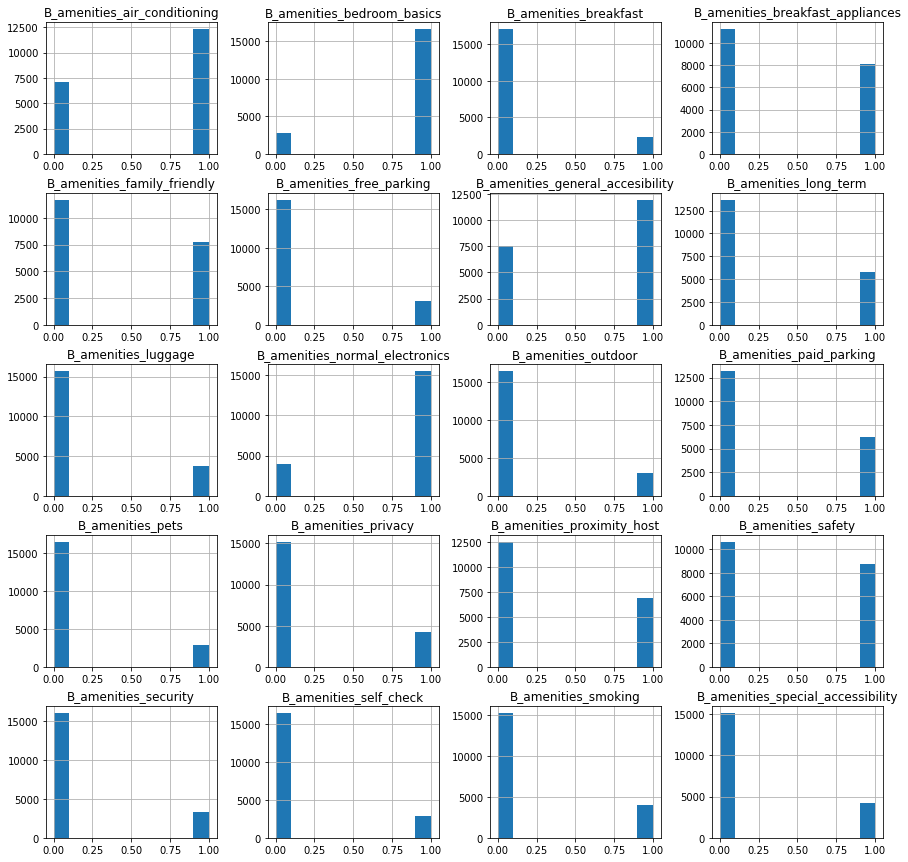

In [59]:
# Replacing columns with f/t with 0/1
df_temp = def_amenities.replace({'f': 0, 't': 1}, inplace=False)

# Plotting the distribution of numerical and boolean categories
df_temp.hist(figsize=(15,15));

We join both dataframe, drop the "amenities" column and we would have finished with the categorical variables

In [60]:
df_rev.drop(['amenities'], axis=1, inplace=True)
df_full = df_rev.join(def_amenities, on = 'id', how = 'inner')
df_full.head()

,host_response_time,host_response_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,...,B_amenities_general_accesibility,B_amenities_free_parking,B_amenities_paid_parking,B_amenities_air_conditioning,B_amenities_privacy,B_amenities_safety,B_amenities_luggage,B_amenities_breakfast,B_amenities_self_check,B_amenities_long_term
id,,,,,,,,,,,,,,,,,,,,,
6369,within a few hours,100%,f,f,Hispanoamérica,Apartment,Private room,2,1.0,1.0,...,t,f,f,t,f,f,f,f,f,f
21853,unknown,unknown,f,t,Cármenes,Apartment,Private room,1,1.0,1.0,...,t,t,f,t,f,t,f,f,f,f
23001,within an hour,100%,f,f,Legazpi,Apartment,Entire home/apt,6,2.0,3.0,...,t,f,t,t,t,f,t,f,f,t
24805,within a few hours,100%,f,t,Universidad,Apartment,Entire home/apt,3,1.0,0.0,...,t,f,t,t,f,t,t,f,t,t
24836,within a few hours,100%,t,f,Justicia,Apartment,Entire home/apt,4,1.5,2.0,...,t,f,t,t,f,f,f,f,f,f


### Numerical features
We will check the numerical columns in search of nulls. Maybe we have to drop some more

In [61]:
num_cols = df_full.select_dtypes(include=['float64', 'int64']).columns
for num_col in num_cols:
    num_nans = df_full[num_col].isna().sum()
    if num_nans > 0:
        print(f"{num_col}. Max: {df_full[num_col].max()}. Min: {df_full[num_col].min()}. NaNs: {num_nans}")

bathrooms. Max: 16.5. Min: 0.0. NaNs: 10
bedrooms. Max: 50.0. Min: 0.0. NaNs: 11
beds. Max: 59.0. Min: 0.0. NaNs: 44
security_deposit. Max: 4500.0. Min: 0.0. NaNs: 5997
cleaning_fee. Max: 500.0. Min: 0.0. NaNs: 4320
review_scores_rating. Max: 100.0. Min: 20.0. NaNs: 3328
review_scores_accuracy. Max: 10.0. Min: 2.0. NaNs: 3330
review_scores_cleanliness. Max: 10.0. Min: 2.0. NaNs: 3328
review_scores_checkin. Max: 10.0. Min: 2.0. NaNs: 3328
review_scores_communication. Max: 10.0. Min: 2.0. NaNs: 3327
review_scores_location. Max: 10.0. Min: 2.0. NaNs: 3331
review_scores_value. Max: 10.0. Min: 2.0. NaNs: 3332


The null values of the columns like **"review_scores_*"** are due there are ads without reviews
<br> We will categorize them as "no review" and group the rest of the values

In [62]:
review_scores_100 = ['review_scores_rating']
review_scores_10 = [
    'review_scores_accuracy', 
    'review_scores_cleanliness', 
    'review_scores_checkin', 
    'review_scores_communication',
    'review_scores_location',
    'review_scores_value'
]

nan_label='no reviews'
bins_100 = [0, 80, 95, 100]
labels_100 = ['0-79/100', '80-94/100', '95-100/100']

bins_10 = [0, 8, 9, 10]
labels_10 = ['0-8/10', '9/10', '10/10']

bin_columns(df_full, review_scores_100, bins_100, labels_100, nan_label)
bin_columns(df_full, review_scores_10, bins_10, labels_10, nan_label)

df_full.review_scores_checkin.value_counts()

10/10         11795
9/10           3365
no reviews     3328
0-8/10          952
Name: review_scores_checkin, dtype: int64

NaN values for **"security_deposit"** and **"cleaning_fee"** will be impute to 0

In [63]:
df_full.loc[df_full.security_deposit.isna(), 'security_deposit'] = 0
df_full.loc[df_full.cleaning_fee.isna(), 'cleaning_fee'] = 0

With **"bathrooms", "bedrooms" and "beds"** we could use the relationship between accommodation and the number of beds, bedrooms and bathrooms. If a house can accommodate more people it must also have more beds, bedrooms and bathrooms

In [64]:
df_accommodates_mean = round(df_full.groupby('accommodates')['bathrooms', 'bedrooms', 'beds'].mean(), 0)
df_accommodates_mean

,bathrooms,bedrooms,beds
accommodates,,,
1,1.0,1.0,1.0
2,1.0,1.0,1.0
3,1.0,1.0,2.0
4,1.0,1.0,2.0
5,1.0,2.0,3.0
6,2.0,2.0,3.0
7,2.0,3.0,4.0
8,2.0,3.0,5.0
9,2.0,3.0,6.0


In [65]:
bathrooms_isna_index = df_full[df_full.bathrooms.isna()].index
df_temp = df_full.loc[bathrooms_isna_index, ['bathrooms', 'accommodates']]

df_full.loc[bathrooms_isna_index, 'bathrooms'] = df_temp.accommodates[bathrooms_isna_index]

In [66]:
bedrooms_isna_index = df_full[df_full.bedrooms.isna()].index
df_temp = df_full.loc[bedrooms_isna_index, ['bedrooms', 'accommodates']]

df_full.loc[bedrooms_isna_index, 'bedrooms'] = df_temp.accommodates[bedrooms_isna_index]

In [67]:
beds_isna_index = df_full[df_full.beds.isna()].index
df_temp = df_full.loc[beds_isna_index, ['beds', 'accommodates']]

df_full.loc[beds_isna_index, 'beds'] = df_temp.accommodates[beds_isna_index]

## Answering questions
* Which areas have the most Airbnb properties, and which are the most expensive?
<br> We need the gps coordinates

In [68]:
df_full_map = df_gps.copy().join(df_full.loc[:, ['B_price_guests', 'neighbourhood_cleansed']], on = 'id', how = 'inner')
df_full_map.head()

,latitude,longitude,B_price_guests,neighbourhood_cleansed
id,,,,
6369,40.45628,-3.67763,35.00,Hispanoamérica
21853,40.40341,-3.74084,17.00,Cármenes
23001,40.38695,-3.69304,60.00,Legazpi
24805,40.42202,-3.70395,40.00,Universidad
24836,40.41995,-3.69764,28.75,Justicia


In [69]:
fig = px.scatter_mapbox(
    df_full_map, lat = "latitude", lon = "longitude",
    color = "B_price_guests", color_continuous_scale = px.colors.cyclical.IceFire,
    zoom = 10
)

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    showlegend=True,
    autosize=True
)

fig.show()

We need to import the geojson data file and get the representatives points to annotate in the map

In [70]:
df_madrid_map = gpd.read_file(f'{datasetDir}/neighbourhoods.geojson')
crs = {"init": "epsg:4326"}  

df_madrid_map = df_madrid_map.rename(columns={"neighbourhood": "neighbourhood_cleansed"})
df_madrid_map = df_madrid_map.set_index('neighbourhood_cleansed')
df_madrid_map = df_madrid_map.drop('neighbourhood_group', axis=1)

df_madrid_map['rep_point'] = df_madrid_map.geometry.apply(lambda x: x.representative_point().coords[:][0])

We group by "neighbourhood_cleansed" and we generate a GeoDataFrame to draw a color map (I can't do it with Plotly)

In [71]:
df_agg_neighbourhood = df_full_map.groupby('neighbourhood_cleansed').size().to_frame()
df_agg_neighbourhood.rename(columns={0: 'number_of_listings'}, inplace=True)
df_agg_neighbourhood['median_price'] = df_full_map.groupby('neighbourhood_cleansed').B_price_guests.median().values
df_agg_neighbourhood['mean_price'] = round(df_full_map.groupby('neighbourhood_cleansed').B_price_guests.mean(), 2).values

geo_df_agg_neighbourhood = gpd.GeoDataFrame(
    df_agg_neighbourhood.join(df_madrid_map, on = 'neighbourhood_cleansed', how = 'inner'), 
    crs = crs
) 

geo_df_agg_neighbourhood.sort_values(by='number_of_listings')

,number_of_listings,median_price,mean_price,geometry,rep_point
neighbourhood_cleansed,,,,,
Horcajo,1,30.00,30.00,"MULTIPOLYGON (((-3.62172 40.41308, -3.62128 40...","(-3.6267397880355574, 40.408416)"
El Pardo,2,33.00,33.00,"MULTIPOLYGON (((-3.65273 40.64275, -3.65250 40...","(-3.793460996281465, 40.5562945)"
Fuentelareina,3,20.00,46.67,"MULTIPOLYGON (((-3.73742 40.48957, -3.73707 40...","(-3.739902266262524, 40.480324)"
Valdemarín,5,60.00,80.00,"MULTIPOLYGON (((-3.76259 40.46143, -3.76266 40...","(-3.782542982189973, 40.4681135)"
El Plantío,5,32.25,39.83,"MULTIPOLYGON (((-3.83804 40.47093, -3.83744 40...","(-3.8193116622862573, 40.469333)"
...,...,...,...,...,...
Justicia,1138,45.00,62.07,"MULTIPOLYGON (((-3.69546 40.41898, -3.69645 40...","(-3.6957165641654988, 40.423874999999995)"
Sol,1308,45.00,59.23,"MULTIPOLYGON (((-3.70475 40.42027, -3.70150 40...","(-3.7043801662531006, 40.41691)"
Palacio,1467,40.00,56.90,"MULTIPOLYGON (((-3.70584 40.42030, -3.70625 40...","(-3.7155012056631884, 40.415026)"


We define a function and plot number of listings, median and mean
### number of listings

In [72]:
def region_plot(df_plot, column, rep_point_col = 'rep_point', titleName = '', legend_label = '', 
                fontsize=10, annonations = False, aspect = 1., figsize=(25, 25), dpi = 100):
    fig, ax = plt.subplots(figsize=figsize, dpi = dpi)

    df_plot.plot(
        alpha = 1, cmap='Blues', edgecolor = "black", ax = ax, 
        column=column,
        legend=True,
        legend_kwds={'label': legend_label, 'orientation': "vertical"}
    )

    if annonations != False:
        for idx, row in df_plot.iterrows():
            ax.annotate(
                s=idx, 
                xy=row[rep_point_col],
                horizontalalignment='center'
            )
        
    ax.axis('off')
    ax.set_title(titleName, fontsize=fontsize)

    ax.set_aspect(aspect=aspect)
    ax.margins(0)
    ax.apply_aspect()
    
    plt.show()

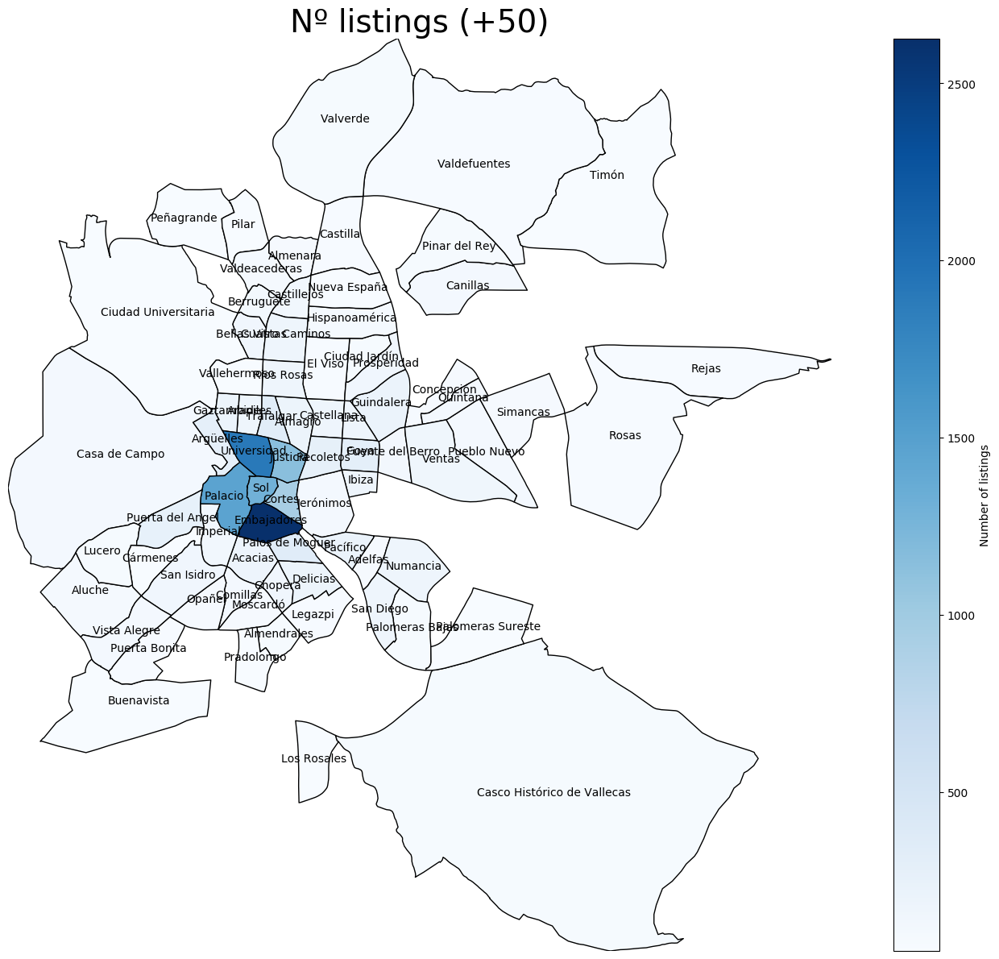

In [73]:
region_plot(
    geo_df_agg_neighbourhood[geo_df_agg_neighbourhood['number_of_listings']>50], 
    column = 'number_of_listings', titleName = 'Nº listings (+50)', fontsize=28, annonations = True, 
    aspect=4./3, legend_label = 'Number of listings', figsize=(20, 15))

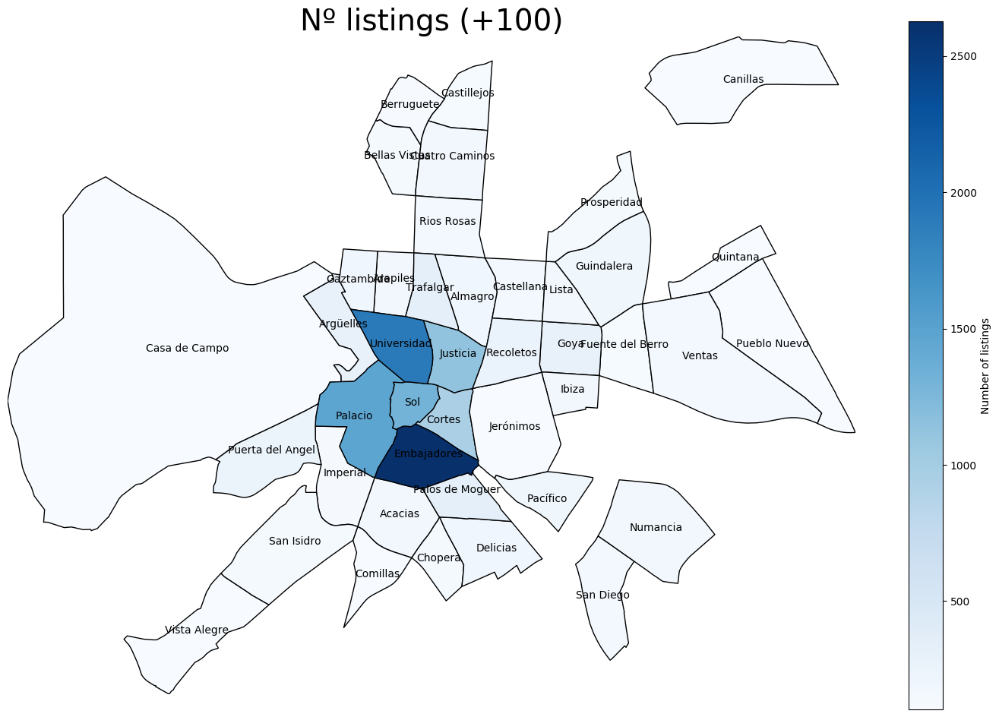

In [74]:
region_plot(
    geo_df_agg_neighbourhood[geo_df_agg_neighbourhood['number_of_listings']>100], 
    column = 'number_of_listings', titleName = 'Nº listings (+100)', 
    fontsize=28, annonations = True, aspect = 4./3, legend_label = 'Number of listings', figsize=(18, 12)
)

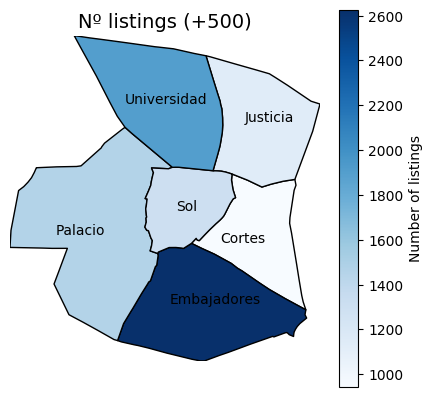

In [75]:
region_plot(
    geo_df_agg_neighbourhood[geo_df_agg_neighbourhood['number_of_listings']>500], 
    column = 'number_of_listings', titleName = 'Nº listings (+500)', 
    fontsize=14, annonations = True, aspect = 4./3, legend_label = 'Number of listings', figsize=(5, 5)
)

In [76]:
geo_df_agg_neighbourhood[geo_df_agg_neighbourhood['number_of_listings']>500][['number_of_listings', 'median_price']]

,number_of_listings,median_price
neighbourhood_cleansed,,
Cortes,943,39.0
Embajadores,2627,35.0
Justicia,1138,45.0
Palacio,1467,40.0
Sol,1308,45.0
Universidad,1909,45.0


The largest number of houses is in the center
### Price per guest included
<br> Mean or median? There are listings with a high price, only one guest included but that "accomodates" is high. Let's use median to soften those anomalies

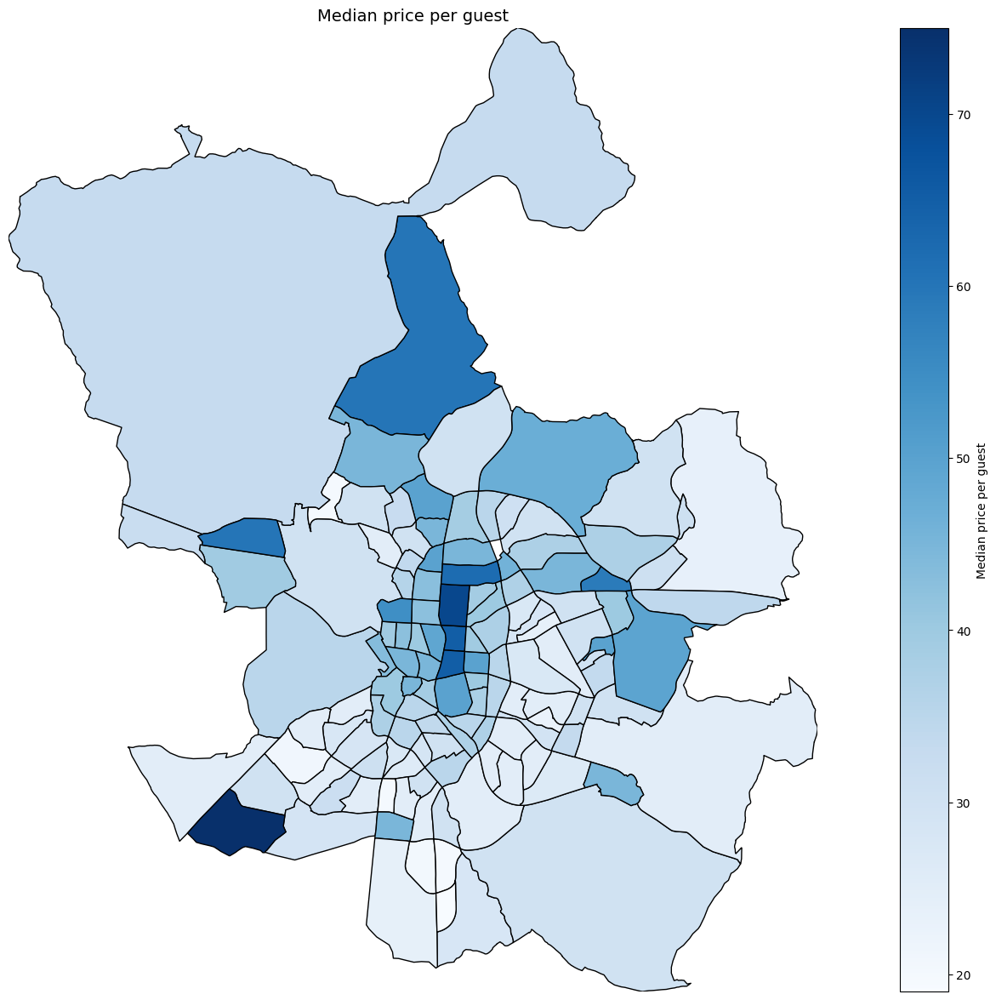

In [77]:
region_plot(
    geo_df_agg_neighbourhood, 
    column = 'median_price', titleName = 'Median price per guest', 
    fontsize=14, annonations = False, aspect = 4./3, legend_label = 'Median price per guest', figsize=(25, 15)
)

There are peripheral areas with a high median. Let's filter by 50$

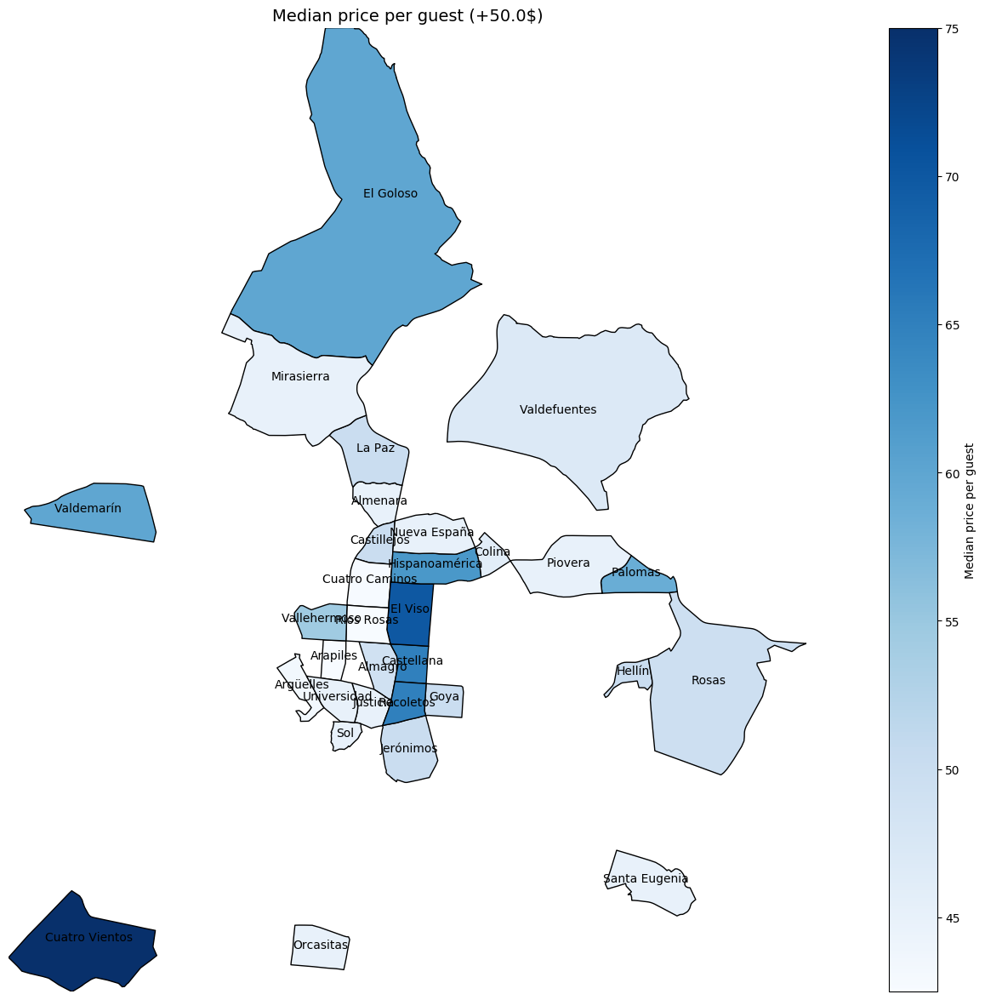

In [78]:
region_plot(
    geo_df_agg_neighbourhood[geo_df_agg_neighbourhood['median_price']>40.], 
    column = 'median_price', titleName = 'Median price per guest (+50.0$)', 
    fontsize=14, annonations = True, aspect = 4./3, legend_label = 'Median price per guest', figsize=(25, 15)
)

In [79]:
geo_df_agg_neighbourhood[geo_df_agg_neighbourhood['median_price']>50][['number_of_listings', 'median_price']]

,number_of_listings,median_price
neighbourhood_cleansed,,
Castellana,168,65.0
Cuatro Vientos,7,75.0
El Goloso,11,60.0
El Viso,71,70.0
Hispanoamérica,100,62.0
Palomas,17,59.0
Recoletos,274,65.0
Valdemarín,5,60.0
Vallehermoso,56,54.5


The areas with the highest median price are no longer concentrated in the city center. The "Cuatro Vientos" area is notable, surely there is a high demand due to the air base sited there. However it has little offer, which would explain these high prices

In [80]:
df_full_map[df_full_map.neighbourhood_cleansed == 'Cuatro Vientos']

,latitude,longitude,B_price_guests,neighbourhood_cleansed
id,,,,
20324976,40.37025,-3.77034,75.0,Cuatro Vientos
30261870,40.36806,-3.76347,15.0,Cuatro Vientos
33801693,40.37194,-3.77140,55.0,Cuatro Vientos
35125746,40.36734,-3.76397,17.0,Cuatro Vientos
35157642,40.36698,-3.76177,250.0,Cuatro Vientos
35184131,40.36721,-3.76252,200.0,Cuatro Vientos
36707244,40.37160,-3.76639,100.0,Cuatro Vientos


## Which amenities increase the price of an Airbnb listing?
We will draw a barchart for every amenity

In [81]:
dict_amenities = {
    x:x.replace('B_amenities_', '').replace('_', ' ').upper() 
    for x in df_full.filter(like='B_amenities_').columns.to_list()
}

def plot_barchart(df, dict_columns = dict_amenities, width=800, height=300):   
    for col in list(dict_columns):
        s_1 = df.groupby(col).size()
        s_2 = df.groupby(col)['B_price_guests'].median()

        fig = make_subplots(rows=1, cols=2, shared_xaxes=True, 
                    subplot_titles=("Listings number","Median price ($)"))
        
        fig.add_trace(go.Bar(
            x=s_1.index, y=s_1.values, marker_color='indianred',
            text=s_1.values, textposition='auto'), row=1, col=1)

        fig.add_trace(go.Bar(
            x=s_2.index, y=s_2.values, marker_color='seagreen',
            text=s_2.values, textposition='auto'), row=1, col=2)

        fig.update_layout(title_text=dict_columns[col], showlegend=False, width=width, height=height)
        fig.show()

In [82]:
plot_barchart(df_full)

These are the things that seem to influence (positively) the median price:
* Normal electronics: DVD player, Printer, TV, Cable TV, Sound system, High-resolution computer monitor
* Air conditioning: Central air conditioning, Air conditioning

What if only the neighborhoods with the highest number of listings are reviewed?

In [83]:
many_listings = geo_df_agg_neighbourhood[geo_df_agg_neighbourhood['number_of_listings']>500].index.to_list()
many_listings

['Cortes', 'Embajadores', 'Justicia', 'Palacio', 'Sol', 'Universidad']

In [84]:
df_full_many = df_full.loc[df_full.neighbourhood_cleansed.isin(many_listings)].copy()
plot_barchart(df_full_many)

Others amenities begin to influence the price because these neighborhoods are in the center of the city.
* Normal electronics: DVD player, Printer, TV, Cable TV, Sound system, High-resolution computer monitor
* Air conditioning: Central air conditioning, Air conditioning
* General accesibility (little): Well-lit path to entrance, Elevator
<br> In the center there are old buildings without an elevator. Maybe for that reason customers look for the house to have an elevator in these neighborhoods
* Free parking: Free street parking, Free parking on premises
<br> It's difficult to park the car in the central neighborhoods
* Privacy: Private living room, Private bathroom, Private entrance, En suite bathroom

## Influence of host features
We want to analyze how categorical variables related to the host affect the median price
* 'host_response_time'
* 'host_response_rate'
* 'host_is_superhost'
* 'host_identity_verified'

In [85]:
host_cols = df_full.filter(like='host_').columns.to_list()
dict_host = {key:key.replace('_', ' ').upper() for key in host_cols}
del dict_host['B_host_days_active'] # this is not a categorical variable
dict_host

{'host_response_time': 'HOST RESPONSE TIME',
 'host_response_rate': 'HOST RESPONSE RATE',
 'host_is_superhost': 'HOST IS SUPERHOST',
 'host_identity_verified': 'HOST IDENTITY VERIFIED'}

In [86]:
plot_barchart(df_full, dict_host)

**'host_response_time' and 'host_response_rate'**<br>
The "worst" categories are those with the highest median price. It seems that this feature does not "cause" the price, but is a consequence of the price above the median. The host knows that he has a well-valued property in Air Bnb and does not give such exhaustive attention to potential clients

**'host_is_superhost' and 'host_identity_verified'**<br>
The definition of 'host_is_superhost', according to [Air Bnb](https://www.airbnb.co.uk/help/article/828/what-is-a-superhost?_set_bev_on_new_domain=1579644646_eBD%2Bqp6saBYIE3Z7) 
> "Superhosts are experienced hosts who provide a shining example for other hosts, and extraordinary experiences for their guests"

The definition of 'host_identity_verified', according to [Air Bnb](https://www.airbnb.co.uk/help/article/1237/how-does-it-work-when-airbnb-verifies-your-identity?_set_bev_on_new_domain=1579644646_eBD%2Bqp6saBYIE3Z7)
> At Airbnb, we’re always working on making our community as secure as possible for everyone. That’s why, before booking a home or experience, or becoming a host, we may ask for a government ID or ask you to confirm your legal name and add your address

In both cases there is no effect on the price